## Business Problem

## Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='whitegrid')
import warnings 
warnings.filterwarnings('ignore')
import pandas_profiling
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler,PowerTransformer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,roc_auc_score,classification_report,confusion_matrix,roc_curve,auc,plot_roc_curve
plt.style.use('ggplot')
#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Moudles related to feature selection
from sklearn.feature_selection import RFE,SelectKBest,f_classif

## Create UDFs

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

## Import Data

In [3]:
df = pd.read_csv('E:/DataTrained/Intership_Flip Robo/final_projects/WA_Fn-UseC_-HR-Employee-Attrition.csv')
pd. set_option('display.max_columns', 700)
pd.set_option('display.width', 100)
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8


## Data Inspection

In [4]:
#profile = pandas_profiling.ProfileReport(df)
#profile.to_widgets()

In [5]:
# data informatiion
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

##### Some data type should be Categorical such as: Education,EnvironmentalSatisfaction, JobInvolvement, JobSatisfaction
##### PerformanceRating,Relationshipsatisfaction, StockOptionLevel and WorkLifeBalance

In [6]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction',
       'Gender', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [7]:
cat_list=['Education','EnvironmentSatisfaction','JobInvolvement','JobSatisfaction','PerformanceRating','RelationshipSatisfaction','StockOptionLevel','WorkLifeBalance']

In [8]:
# change the cat features to object
for i in cat_list:
    df[i]=df[i].astype('object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   object
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   object
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   object
 14  JobLevel                

In [10]:
# shape 
df.shape

(1470, 35)

##### Dataset has 1470 rows and 35 columns

In [11]:
# Check null values in  data
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

##### There are no Null values

In [12]:
df.isin(['NAN','NA','N/A','-',' ','?',np.nan]).sum().any()

False

In [13]:
# Value counts for every feature to check the missing again or unique values
for i in df.columns:
    print(df[i].value_counts())
    print('**********************************')

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64
**********************************
No     1233
Yes     237
Name: Attrition, dtype: int64
**********************************
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
**********************************
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64
**********************************
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
********

In [14]:
# Drop features with high cardinality such as EmployeeCount, Over18 and StandardHours
# EmployeeNumber is a unique Value for each Employee
df.drop(['EmployeeCount','Over18','StandardHours','EmployeeNumber'],axis=1,inplace=True)

In [15]:
# Check imbalance of the target data
df.Attrition.value_counts(normalize=True)

No     0.838776
Yes    0.161224
Name: Attrition, dtype: float64

##### We have Imbalanced data. So we can use Smote to balance the data later before modeling.

In [16]:
# split train data to continous and categorical varaiables.
num=df.select_dtypes(include=['float64','int64'])
cat=df.select_dtypes(include=['object'])

In [17]:
# Descriptive analysis for continous data
num.apply(continuous_var_summary)

,Age,DailyRate,DistanceFromHome,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
N,1470.000000,1.470000e+03,1470.000000,1470.000000,1470.000000,1.470000e+03,1.470000e+03,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
NMISS,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SUM,54278.000000,1.179654e+06,13513.000000,96860.000000,3034.000000,9.559309e+06,2.104026e+07,3959.000000,22358.000000,16581.000000,4115.000000,10302.000000,6217.000000,3216.000000,6061.000000
MEAN,36.923810,8.024857e+02,9.192517,65.891156,2.063946,6.502931e+03,1.431310e+04,2.693197,15.209524,11.279592,2.799320,7.008163,4.229252,2.187755,4.123129
MEDIAN,36.000000,8.020000e+02,7.000000,66.000000,2.000000,4.919000e+03,1.423550e+04,2.000000,14.000000,10.000000,3.000000,5.000000,3.000000,1.000000,3.000000
STD,9.135373,4.035091e+02,8.106864,20.329428,1.106940,4.707957e+03,7.117786e+03,2.498009,3.659938,7.780782,1.289271,6.126525,3.623137,3.222430,3.568136
VAR,83.455049,1.628196e+05,65.721251,413.285626,1.225316,2.216486e+07,5.066288e+07,6.240049,13.395144,60.540563,1.662219,37.534310,13.127122,10.384057,12.731595
MIN,18.000000,1.020000e+02,1.000000,30.000000,1.000000,1.009000e+03,2.094000e+03,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P1,19.000000,1.170000e+02,1.000000,30.000000,1.000000,1.382460e+03,2.325070e+03,0.000000,11.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P5,24.000000,1.653500e+02,1.000000,33.000000,1.000000,2.097900e+03,3.384550e+03,0.000000,11.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000


In [18]:
# Descriptive analysis for categorical data
cat.describe(include='O')

,Attrition,BusinessTravel,Department,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance
count,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,5,6,4,2,4,9,4,3,2,2,4,4,4
top,No,Travel_Rarely,Research & Development,3,Life Sciences,3,Male,3,Sales Executive,4,Married,No,3,3,0,3
freq,1233,1043,961,572,606,453,882,868,326,459,673,1054,1244,459,631,893


## EDA

#### Univariate analysis

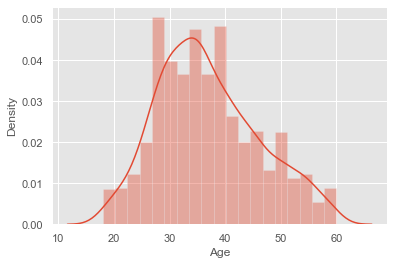

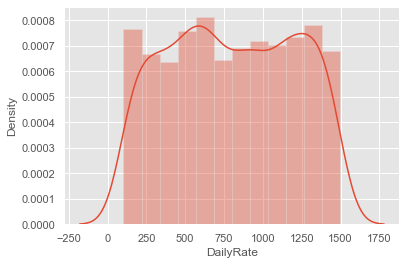

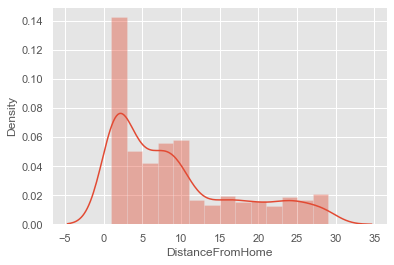

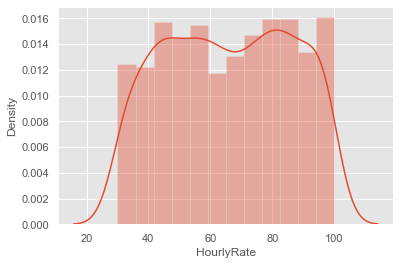

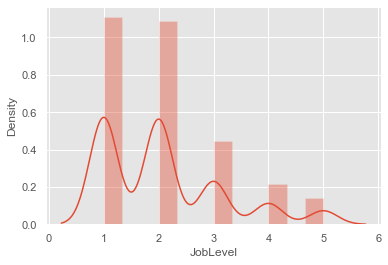

...

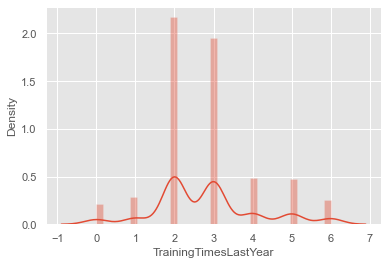

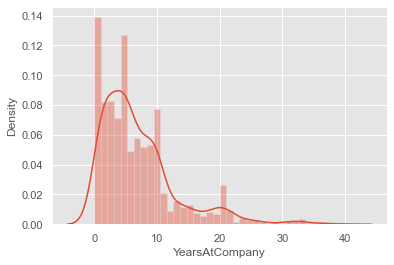

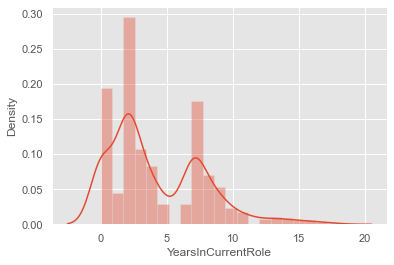

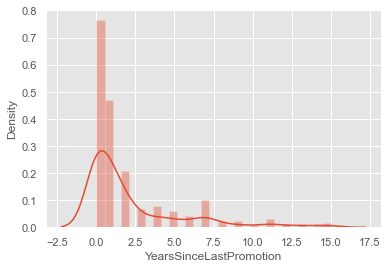

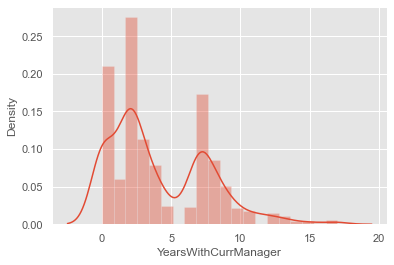

In [19]:
# Check Normality of continous data
for i in num.columns:
    sns.distplot(num[i])
    plt.show()

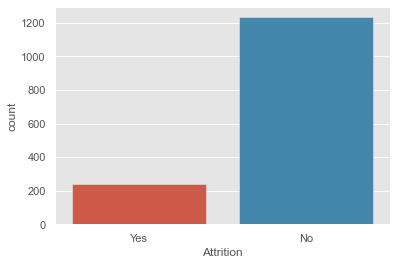

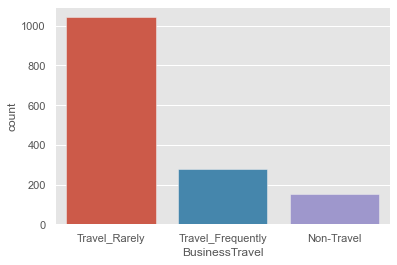

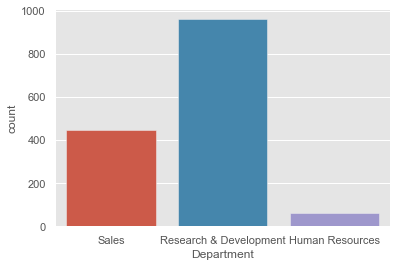

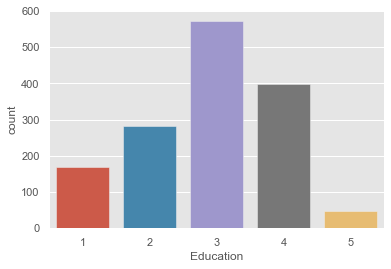

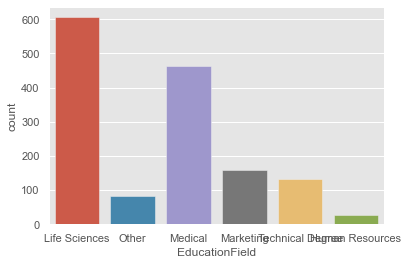

...

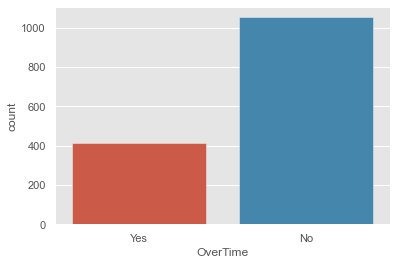

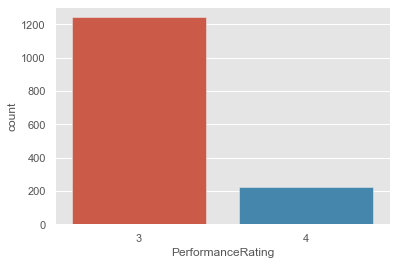

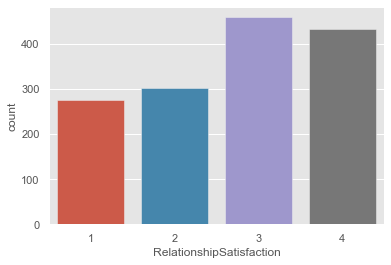

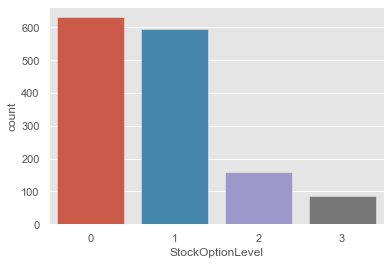

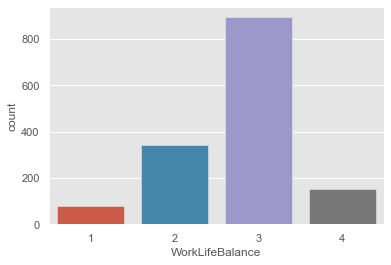

In [20]:
# Check count of categorical data
for i in cat.columns:
    sns.countplot(cat[i])
    plt.show()

In [21]:
df["TrainingTimesLastYear"].value_counts()

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64

-------------------------------------------------------------------------------------------------------------------------------

### Bivariate analysis

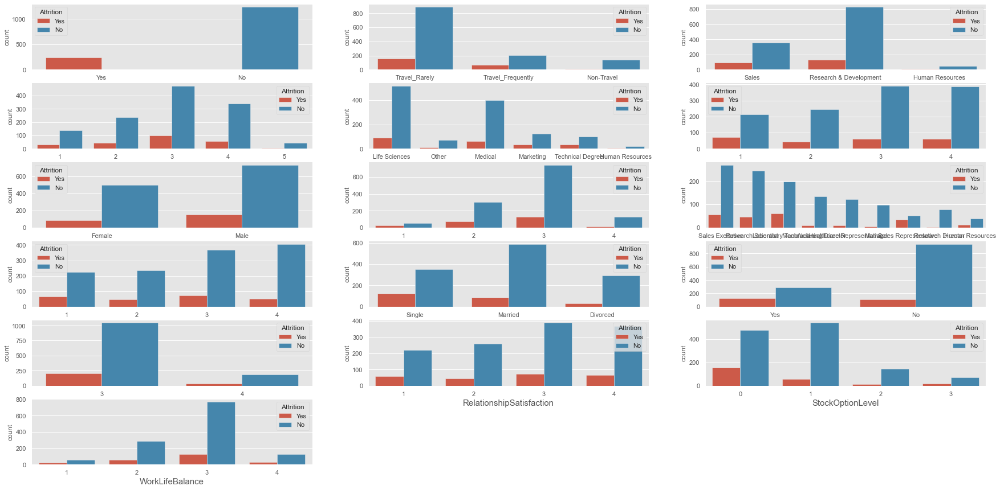

In [22]:
plt.figure(figsize=(30,20), facecolor='white')
plotnumber = 1

for i in cat.columns:
    if plotnumber<=24 :
        ax = plt.subplot(8,3,plotnumber)
        sns.countplot(x=cat[i],hue=df.Attrition)
        plt.xlabel(i,fontsize=15)
       
    plotnumber+=1
plt.show()

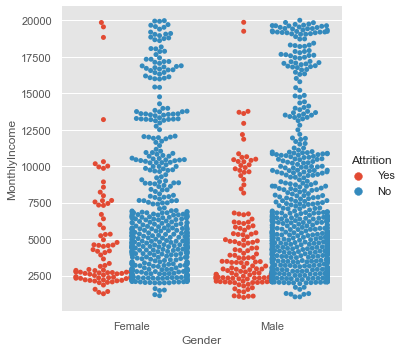

In [23]:
# Gender and Monthly Income have any effect on Attrition

sns.catplot(x = "Gender", y = "MonthlyIncome", hue = "Attrition", kind = "swarm", data=df, split=True)

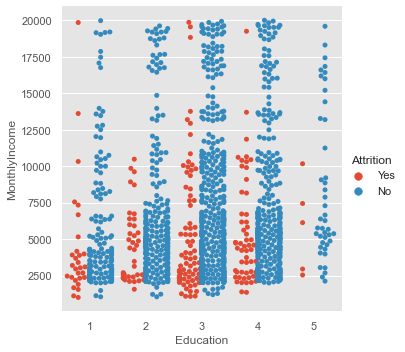

In [24]:
# Education and Monthly Income effect Attrition? 

sns.catplot(x = "Education", y = "MonthlyIncome", hue = "Attrition", kind = "swarm", data=df, split=True)

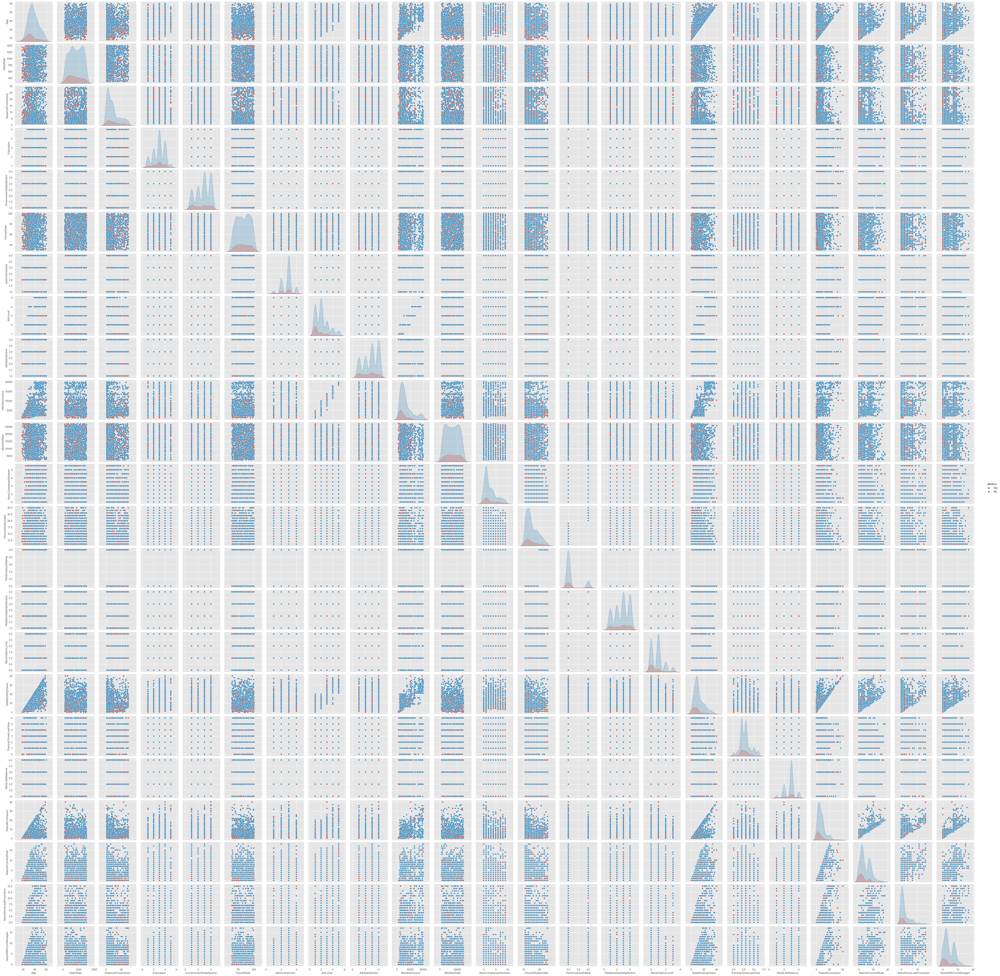

In [25]:
sns.pairplot(df,hue="Attrition")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Outlier Treatment

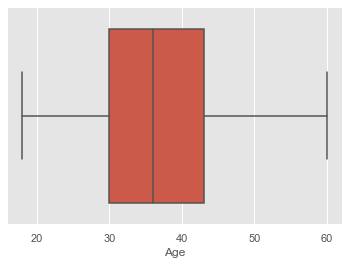

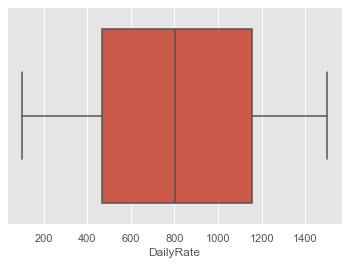

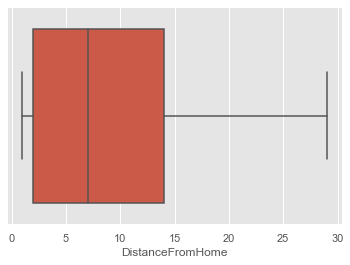

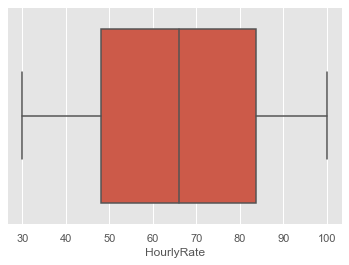

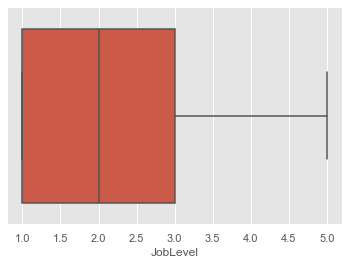

...

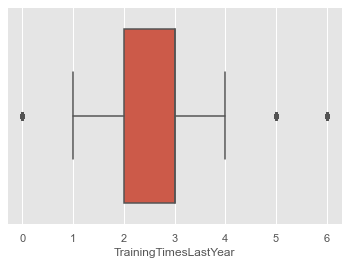

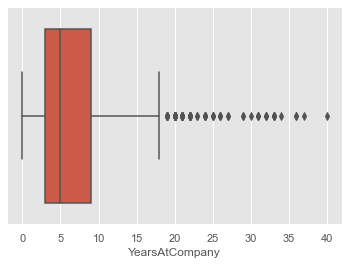

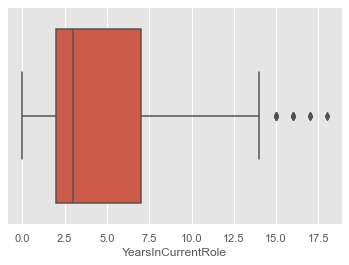

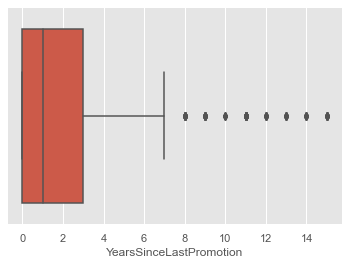

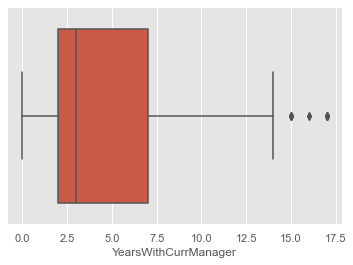

In [26]:
# Check outliers using boxplot
for col in num.columns:
    sns.boxplot(num[col])
    plt.show()

In [27]:
# use Z-score method
outliers=num[num.columns.difference(['NumCompaniesWorked','TrainingTimesLastYear'])]


z=np.abs(zscore(outliers))
df_new=df[(z<3).all(axis=1)]
df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,No,17,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,No,14,3,4,0,17,3,2,9,6,0,8


In [28]:
# data loss percentage

loss_percentage= ((num.shape[0]- df_new.shape[0])/num.shape[0])*100
loss_percentage

5.646258503401361

##### It's acceptable.

In [29]:
# Check Skewness
df_new.skew()

Age                         0.472280
DailyRate                  -0.017078
DistanceFromHome            0.954752
Education                  -0.289024
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobSatisfaction            -0.345612
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
YearsAtCompany              1.248623
YearsInCurrentRole          0.726675
YearsSinceLastPromotion     1.756335
YearsWithCurrManager        0.694506
dtype: float64

In [30]:
# I'll consider -0.5/0.5 is ok among features skewness and treat the others features.

skew_cols=["DistanceFromHome","MonthlyIncome","NumCompaniesWorked","PercentSalaryHike",
           "TotalWorkingYears","TrainingTimesLastYear","YearsAtCompany","YearsInCurrentRole",
           "YearsSinceLastPromotion","YearsWithCurrManager"]

In [31]:
#Removing the Skewness

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer()
df_new[skew_cols] = scaler.fit_transform(df_new[skew_cols].values)

In [32]:
#Checking the skewness again

df_new.skew()

Age                         0.472280
DailyRate                  -0.017078
DistanceFromHome           -0.008149
Education                  -0.289024
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobSatisfaction            -0.345612
MonthlyIncome               0.027700
MonthlyRate                 0.030596
NumCompaniesWorked          0.016175
PercentSalaryHike           0.112128
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.057949
WorkLifeBalance            -0.557100
YearsAtCompany             -0.025230
YearsInCurrentRole         -0.069631
YearsSinceLastPromotion     0.212301
YearsWithCurrManager       -0.070570
dtype: float64

In [33]:
# Encoding using getdummies
nominal_col=['Attrition','BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus','OverTime']
df_final=pd.get_dummies(df_new,columns=nominal_col, drop_first=True)

In [34]:
# View # final dataset
df_final

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Yes,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,-1.489968,2,2,94,3,2,4,0.386674,19479,1.620671,-1.495549,3,1,0,-0.173231,-2.608524,1,0.231837,0.290524,-1.073534,0.582177,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,279,0.244561,1,3,61,2,2,2,0.144235,24907,-0.561880,1.690425,4,4,1,0.147620,0.217074,3,0.948319,1.006575,0.193168,1.018073,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
2,37,1373,-1.028366,2,4,92,2,1,3,-1.431153,2396,1.273711,0.193797,3,2,0,-0.351153,0.217074,3,-2.156089,-1.571814,-1.073534,-1.528426,1,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1
3,33,1392,-0.698191,4,4,56,3,1,3,-0.814425,23159,-0.561880,-1.495549,3,3,0,-0.173231,0.217074,3,0.621429,1.006575,1.027520,-1.528426,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,591,-1.028366,1,1,40,3,1,2,-0.504453,16632,1.764103,-0.957525,3,4,1,-0.544046,0.217074,3,-0.933983,-0.390769,0.722874,-0.347871,0,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,1.408969,2,3,41,4,2,4,-1.039557,12290,0.798319,0.716255,3,3,1,1.039364,0.217074,3,0.003289,-0.390769,-1.073534,0.018680,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
1466,39,613,-0.049519,1,4,42,2,3,1,1.127335,21457,0.798319,0.193797,3,1,1,-0.007630,1.606919,3,0.436162,1.006575,0.193168,1.018073,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1467,27,155,-0.440553,3,2,87,4,2,2,0.424210,5174,-0.561880,1.285201,4,2,1,-0.544046,-2.608524,3,0.231837,-0.390769,-1.073534,0.018680,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1
1468,49,1023,-1.028366,3,4,63,2,2,2,0.222228,13243,0.052119,-0.129959,3,4,0,1.039364,0.217074,2,0.791264,0.793764,-1.073534,1.205782,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0


-------------------------------------------------------------------------------------------------------------------------------

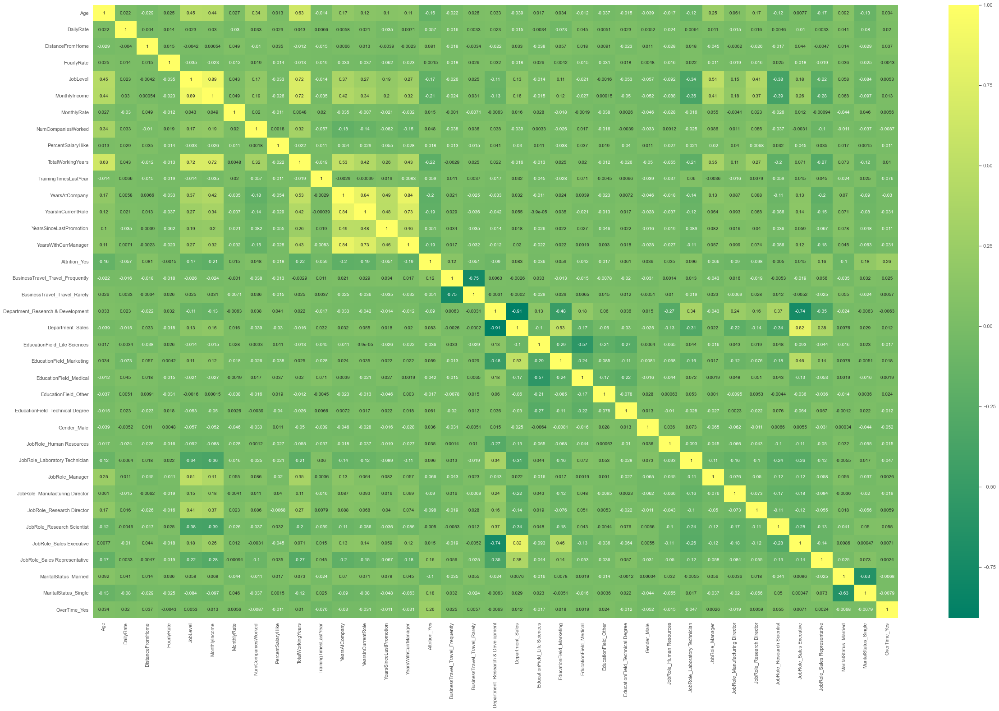

In [35]:
# heatmap correlation
plt.figure(figsize = (40,25))
sns.heatmap(df_final.corr(), annot=True,cmap='summer')
plt.show()

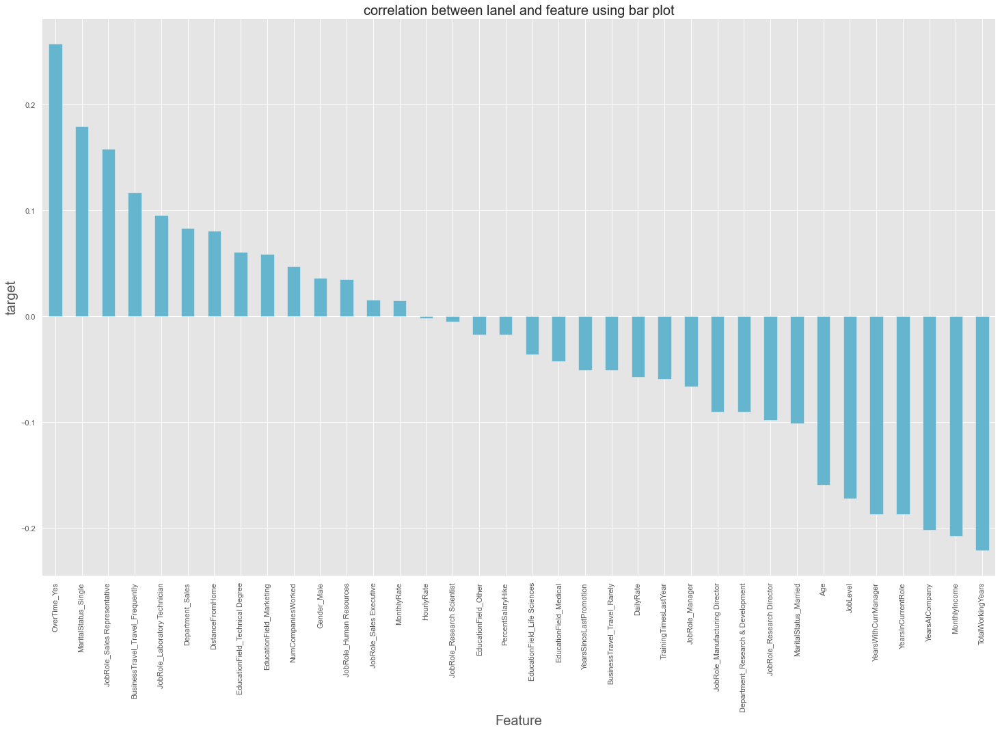

In [36]:
plt.figure(figsize = (25, 15))

df_final.corr()['Attrition_Yes'].sort_values(ascending = False).drop(['Attrition_Yes']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('target', fontsize = 20)

plt.title('correlation between lanel and feature using bar plot', fontsize = 20)

plt.show()

In [37]:
# Dropping these feeatures

df_final.drop(['JobRole_Research Scientist','HourlyRate','JobLevel','Department_Research & Development'],axis=1,inplace=True)

In [38]:
df_final

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Yes,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,-1.489968,2,2,3,4,0.386674,19479,1.620671,-1.495549,3,1,0,-0.173231,-2.608524,1,0.231837,0.290524,-1.073534,0.582177,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,279,0.244561,1,3,2,2,0.144235,24907,-0.561880,1.690425,4,4,1,0.147620,0.217074,3,0.948319,1.006575,0.193168,1.018073,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
2,37,1373,-1.028366,2,4,2,3,-1.431153,2396,1.273711,0.193797,3,2,0,-0.351153,0.217074,3,-2.156089,-1.571814,-1.073534,-1.528426,1,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,1
3,33,1392,-0.698191,4,4,3,3,-0.814425,23159,-0.561880,-1.495549,3,3,0,-0.173231,0.217074,3,0.621429,1.006575,1.027520,-1.528426,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,27,591,-1.028366,1,1,3,2,-0.504453,16632,1.764103,-0.957525,3,4,1,-0.544046,0.217074,3,-0.933983,-0.390769,0.722874,-0.347871,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,1.408969,2,3,4,4,-1.039557,12290,0.798319,0.716255,3,3,1,1.039364,0.217074,3,0.003289,-0.390769,-1.073534,0.018680,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0
1466,39,613,-0.049519,1,4,2,1,1.127335,21457,0.798319,0.193797,3,1,1,-0.007630,1.606919,3,0.436162,1.006575,0.193168,1.018073,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0
1467,27,155,-0.440553,3,2,4,2,0.424210,5174,-0.561880,1.285201,4,2,1,-0.544046,-2.608524,3,0.231837,-0.390769,-1.073534,0.018680,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1
1468,49,1023,-1.028366,3,4,2,2,0.222228,13243,0.052119,-0.129959,3,4,0,1.039364,0.217074,2,0.791264,0.793764,-1.073534,1.205782,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0


-----------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

###  Treat the imblance target data

In [39]:
#separating the dependent and independent variable for balancing the class
x = df_final[df_final.columns.difference(['Attrition_Yes'])]
y = df_final.Attrition_Yes

In [40]:
# It's time to dela with imbalance of the target withing SMOTE Technique.
from imblearn.over_sampling import SMOTE

smt = SMOTE()
x,y = smt.fit_resample(x,y)

1    1158
0    1158
Name: Attrition_Yes, dtype: int64


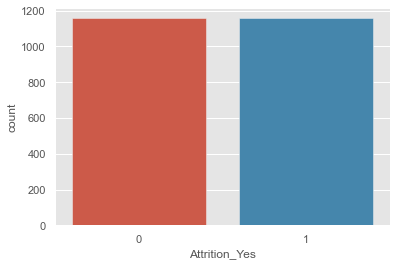

In [41]:
#Checking the count of Attrition

print(y.value_counts())
sns.countplot(y)
plt.show()

------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

### Feature Reduction

##### Weight of evidence & information value

In [42]:
def calculate_woe_iv(dataset, feature, target):
    lst = []
    
    for i in range(dataset[feature].nunique()):
        val = list(dataset[feature].unique())[i]
        lst.append({
            'Value': val,
            'All': dataset[dataset[feature] == val].count()[feature],
            'Good': dataset[(dataset[feature] == val) & (dataset[target] == 0)].count()[feature],
            'Bad': dataset[(dataset[feature] == val) & (dataset[target] == 1)].count()[feature]
        })
        
    dset = pd.DataFrame(lst)
    dset['Distr_Good'] = dset['Good'] / dset['Good'].sum()
    dset['Distr_Bad'] = dset['Bad'] / dset['Bad'].sum()
    dset['WoE'] = np.log(dset['Distr_Good'] / dset['Distr_Bad'])
    dset = dset.replace({'WoE': {np.inf: 0, -np.inf: 0}})
    dset['IV'] = (dset['Distr_Good'] - dset['Distr_Bad']) * dset['WoE']
    iv = dset['IV'].sum()
    
    dset = dset.sort_values(by='WoE')
    
    return dset, iv

In [43]:
for col in df_final.columns:
    if col == 'Attrition_Yes': continue
    else:
        print('WoE and IV for column: {}'.format(col))
        df, iv = calculate_woe_iv(df_final, col, 'Attrition_Yes')
        print('IV score: {:.2f}'.format(iv))
        print('\n')

WoE and IV for column: Age
IV score: 0.56


WoE and IV for column: DailyRate
IV score: 0.64


WoE and IV for column: DistanceFromHome
IV score: 0.15


WoE and IV for column: Education
IV score: 0.02


WoE and IV for column: EnvironmentSatisfaction
IV score: 0.12


WoE and IV for column: JobInvolvement
IV score: 0.13


WoE and IV for column: JobSatisfaction
IV score: 0.10


WoE and IV for column: MonthlyIncome
IV score: 0.21


WoE and IV for column: MonthlyRate
IV score: 0.11


WoE and IV for column: NumCompaniesWorked
IV score: 0.13


WoE and IV for column: PercentSalaryHike
IV score: 0.07


WoE and IV for column: PerformanceRating
IV score: 0.00


WoE and IV for column: RelationshipSatisfaction
IV score: 0.03


WoE and IV for column: StockOptionLevel
IV score: 0.32


WoE and IV for column: TotalWorkingYears
IV score: 0.42


WoE and IV for column: TrainingTimesLastYear
IV score: 0.08


WoE and IV for column: WorkLifeBalance
IV score: 0.07


WoE and IV for column: YearsAtCompany
IV scor

In [44]:
l_iv=['Age','DailyRate','DistanceFromHome','EnvironmentSatisfaction','JobInvolvement','MonthlyIncome','MonthlyRate',
      'NumCompaniesWorked','StockOptionLevel','TotalWorkingYears','YearsAtCompany','JobSatisfaction','YearsInCurrentRole',
      'YearsWithCurrManager','JobRole_Sales Representative','MaritalStatus_Single','OverTime_Yes']

### RFE

In [45]:
rfe = RFE(RandomForestClassifier(), n_features_to_select=15).fit(x,y)

In [46]:
l2_rfe = x.columns[rfe.get_support()]

In [47]:
l2_rfe

Index(['Age', 'DailyRate', 'DistanceFromHome', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobSatisfaction', 'MaritalStatus_Married', 'MonthlyIncome', 'MonthlyRate',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager'],
      dtype='object')

### SKB

In [48]:
SKB = SelectKBest(f_classif, k=15).fit(x, y )

In [49]:
l3_skb = x.columns[SKB.get_support()]

In [50]:
l3_skb

Index(['Age', 'BusinessTravel_Travel_Rarely', 'EducationField_Life Sciences',
       'EducationField_Medical', 'JobInvolvement', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobRole_Sales Executive', 'MaritalStatus_Married',
       'MonthlyIncome', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager'],
      dtype='object')

In [51]:
list(set((l_iv)+list(l2_rfe)+list(l3_skb)))

['TotalWorkingYears',
 'JobSatisfaction',
 'MaritalStatus_Married',
 'EducationField_Life Sciences',
 'MonthlyIncome',
 'JobRole_Sales Representative',
 'YearsWithCurrManager',
 'EnvironmentSatisfaction',
 'NumCompaniesWorked',
 'YearsAtCompany',
 'TrainingTimesLastYear',
 'JobRole_Research Director',
 'OverTime_Yes',
 'BusinessTravel_Travel_Rarely',
 'EducationField_Medical',
 'DailyRate',
 'JobInvolvement',
 'YearsInCurrentRole',
 'Age',
 'MonthlyRate',
 'StockOptionLevel',
 'DistanceFromHome',
 'JobRole_Manufacturing Director',
 'MaritalStatus_Single',
 'JobRole_Sales Executive']

In [52]:
final_list= ['DailyRate',
 'RelationshipSatisfaction',
 'JobRole_Sales Executive',
 'YearsInCurrentRole',
 'JobInvolvement',
 'StockOptionLevel',
 'JobRole_Manufacturing Director',
 'DistanceFromHome',
 'EnvironmentSatisfaction',
 #'YearsAtCompany',
 'JobRole_Research Director',
 'MaritalStatus_Single',
 'WorkLifeBalance',
 'Age',
 'MonthlyRate',
 'YearsWithCurrManager',
 'JobRole_Sales Representative',
 'BusinessTravel_Travel_Rarely',
 'TotalWorkingYears',
 'NumCompaniesWorked',
 'MonthlyIncome',
 'EducationField_Life Sciences',
 'MaritalStatus_Married',
 'EducationField_Medical',
 'JobSatisfaction',
 'OverTime_Yes']

### Standarization

In [53]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Age,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,DailyRate,Department_Sales,DistanceFromHome,Education,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,EnvironmentSatisfaction,Gender_Male,JobInvolvement,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Executive,JobRole_Sales Representative,JobSatisfaction,MaritalStatus_Married,MaritalStatus_Single,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime_Yes,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.727881,-0.428304,0.825043,0.834419,1.863073,-1.664125,-0.930182,1.494870,-0.278766,-0.534745,-0.191587,-0.252684,-0.609844,-1.059633,0.523793,-0.151553,-0.393843,-0.175236,-0.252684,-0.16858,2.390197,-0.211317,1.328648,-0.690000,1.519398,0.604588,0.722325,1.705707,1.541458,-1.571483,-0.465933,-1.651789,-0.844102,0.029604,-2.681800,-2.468150,0.441338,0.496491,-1.095498,0.788687
1,1.673284,2.334792,-1.212057,-1.281902,-0.536748,0.183162,-1.987249,1.494870,-0.278766,-0.534745,-0.191587,-0.252684,0.355417,0.943723,-0.959985,-0.151553,-0.393843,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,-0.602314,1.449276,-0.658155,0.348879,1.494357,-0.637608,-0.648736,1.825508,2.519265,1.334472,0.393961,0.361916,0.304494,0.417787,1.195056,1.258933,0.260340,1.247522
2,0.255179,-0.428304,0.825043,1.531288,-0.536748,-1.172515,-0.930182,-0.668954,-0.278766,-0.534745,5.219569,-0.252684,1.320678,0.943723,-0.959985,-0.151553,2.539084,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,0.363167,-0.690000,1.519398,-1.312737,-1.707414,1.333190,1.541458,0.229753,-0.465933,-0.656369,-0.844102,-0.154673,0.304494,0.417787,-2.070688,-1.486504,-1.095498,-1.432982
3,-0.217522,2.334792,-1.212057,1.580146,-0.536748,-0.820876,1.183953,1.494870,-0.278766,-0.534745,-0.191587,-0.252684,1.320678,-1.059633,0.523793,-0.151553,-0.393843,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,0.363167,1.449276,-0.658155,-0.662253,1.245737,-0.637608,1.541458,-1.571483,-0.465933,0.339052,-0.844102,0.029604,0.304494,0.417787,0.851177,1.258933,1.153405,-1.432982
4,-0.926575,-0.428304,0.825043,-0.479603,-0.536748,-1.172515,-1.987249,-0.668954,-0.278766,1.870050,-0.191587,-0.252684,-1.575105,0.943723,0.523793,-0.151553,2.539084,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,-0.602314,1.449276,-0.658155,-0.335315,0.317392,1.859704,-0.648736,-0.997824,-0.465933,1.334472,0.393961,-0.354456,0.304494,0.417787,-0.785069,-0.228942,0.827320,-0.190302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,-0.690224,-0.428304,-1.212057,1.708719,-0.536748,-1.257517,1.624677,-0.668954,-0.278766,-0.534745,-0.191587,-0.252684,0.496120,-1.059633,1.791284,-0.151553,-0.393843,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,-0.320843,-0.690000,1.519398,0.691095,-0.779212,-0.637608,-0.648736,-1.165307,-0.465933,-1.651789,-0.844102,0.042259,-0.415092,0.207449,0.831943,1.035402,1.010748,0.856792
2312,-0.335698,-0.428304,-1.212057,0.564415,-0.536748,0.269085,-0.478035,-0.668954,-0.278766,-0.534745,-0.191587,-0.252684,1.320678,-1.059633,0.523793,-0.151553,-0.393843,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,0.363167,1.449276,-0.658155,0.245246,1.214446,-0.889284,-0.648736,1.014181,-0.465933,-1.226011,0.393961,0.161842,-0.334180,0.109181,0.923828,0.341344,0.451338,-0.582414
2313,-0.217522,-0.428304,-1.212057,0.188980,-0.536748,0.036147,-0.348391,1.494870,-0.278766,-0.534745,-0.191587,-0.252684,-0.273109,0.943723,-1.109496,-0.151553,2.539084,-0.175236,-0.252684,-0.16858,-0.418375,-0.211317,0.363167,-0.690000,-0.658155,0.464222,1.204348,-0.637608,-0.648736,1.525224,1.177067,-0.008204,-0.28

### VIF check Multicollinarity

In [54]:
x = x[final_list]
y = y

In [55]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [56]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
17,3.834851,TotalWorkingYears
19,2.665544,MonthlyIncome
14,2.596838,YearsWithCurrManager
3,2.550485,YearsInCurrentRole
12,1.895397,Age
10,1.832975,MaritalStatus_Single
5,1.534270,StockOptionLevel
21,1.398479,MaritalStatus_Married
18,1.339732,NumCompaniesWorked
22,1.267860,EducationField_Medical


## ML Alogs

In [60]:
# get best random state
lr=LogisticRegression()
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.25)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if (roc_auc_score(pred_train,y_train)*100)>(roc_auc_score(y_test,pred_test)*100):
        print("At random state ",i," The model performs very well")
        print("Training roc_auc_score is :",round(roc_auc_score(y_train,pred_train)*100,1))
        print("Testing roc_auc_score is:",round(roc_auc_score(y_test,pred_test)*100,1),  '\n\n')

At random state  0  The model performs very well
Training roc_auc_score is : 84.2
Testing roc_auc_score is: 84.1 


At random state  3  The model performs very well
Training roc_auc_score is : 84.6
Testing roc_auc_score is: 82.2 


At random state  4  The model performs very well
Training roc_auc_score is : 84.2
Testing roc_auc_score is: 83.8 


At random state  5  The model performs very well
Training roc_auc_score is : 84.6
Testing roc_auc_score is: 82.8 


At random state  7  The model performs very well
Training roc_auc_score is : 84.7
Testing roc_auc_score is: 82.6 


At random state  8  The model performs very well
Training roc_auc_score is : 84.1
Testing roc_auc_score is: 82.6 


At random state  9  The model performs very well
Training roc_auc_score is : 84.7
Testing roc_auc_score is: 83.6 


At random state  10  The model performs very well
Training roc_auc_score is : 84.4
Testing roc_auc_score is: 82.9 


At random state  11  The model performs very well
Training roc_auc_scor

#### Split the data

In [63]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=96)

### Logistic Regression

In [64]:
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
score_acc=accuracy_score(y_test,pred_test)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Auc test: ',score_acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))

Roc_Auc train:  0.8475033818731599
Roc_Auc test:  0.8366731307907778
Auc test:  0.8359240069084629
Confusion Matrix:  
 [[232  41]
 [ 54 252]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.81      0.85      0.83       273
           1       0.86      0.82      0.84       306

    accuracy                           0.84       579
   macro avg       0.84      0.84      0.84       579
weighted avg       0.84      0.84      0.84       579



### cross-validation

In [65]:
for i in range(3,11):
    cvs=cross_val_score(lr,x,y,cv=i)
    cvs_mean=cvs.mean()
    cvs_std=cvs.std()
    print ("At cv: ",i)
    print ("Cross validation score is : ",cvs_mean*100)
    print ("Cross validation score_std is : ", cvs_std*100)
    print ("Auc Score is : ",score_acc*100)
    print ("\n")

At cv:  3
Cross validation score is :  82.51295336787564
Cross validation score_std is :  5.404313150126041
Auc Score is :  83.59240069084629


At cv:  4
Cross validation score is :  82.16753022452504
Cross validation score_std is :  6.827433918687895
Auc Score is :  83.59240069084629


At cv:  5
Cross validation score is :  82.13152602964175
Cross validation score_std is :  8.341326378279124
Auc Score is :  83.59240069084629


At cv:  6
Cross validation score is :  82.85837651122625
Cross validation score_std is :  7.615606053481214
Auc Score is :  83.59240069084629


At cv:  7
Cross validation score is :  83.16265808712939
Cross validation score_std is :  6.7801835927382825
Auc Score is :  83.59240069084629


At cv:  8
Cross validation score is :  83.12462713280038
Cross validation score_std is :  7.195801289836192
Auc Score is :  83.59240069084629


At cv:  9
Cross validation score is :  83.08331406241098
Cross validation score_std is :  6.991003614587354
Auc Score is :  83.59240069

In [66]:
# pick up cv=3

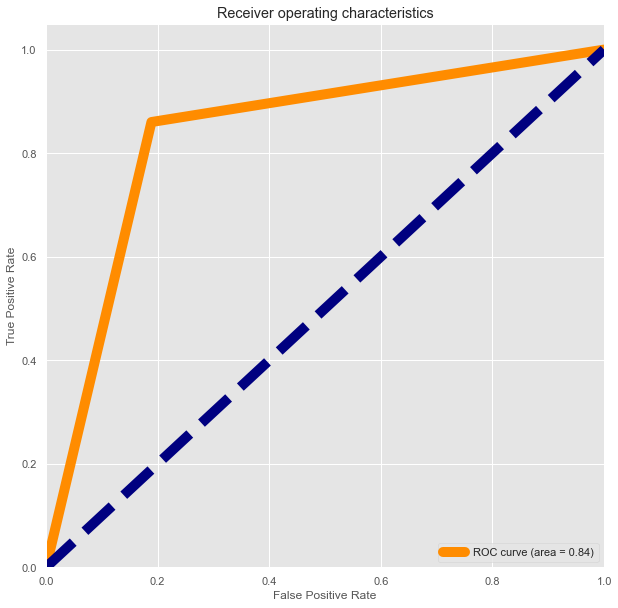

In [67]:
# ROC curve 
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Decision Tree

In [68]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_train=dtc.predict(x_train)
pred_test=dtc.predict(x_test)
score_train=roc_auc_score(y_train,pred_train)
score_test=roc_auc_score(y_test,pred_test)
print('Roc_Auc Score_train: ',score_train)
print('Roc_Auc Score_test: ',score_test)
print('Confusion Matrix: ' ,'\n','\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(dtc,x,y,cv=3).mean())

Roc_Auc Score_train:  1.0
Roc_Auc Score_test:  0.8589025353731237
Confusion Matrix:  
 
 [[237  36]
 [ 46 260]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.84      0.87      0.85       273
           1       0.88      0.85      0.86       306

    accuracy                           0.86       579
   macro avg       0.86      0.86      0.86       579
weighted avg       0.86      0.86      0.86       579

CV  :  0.8281519861830743


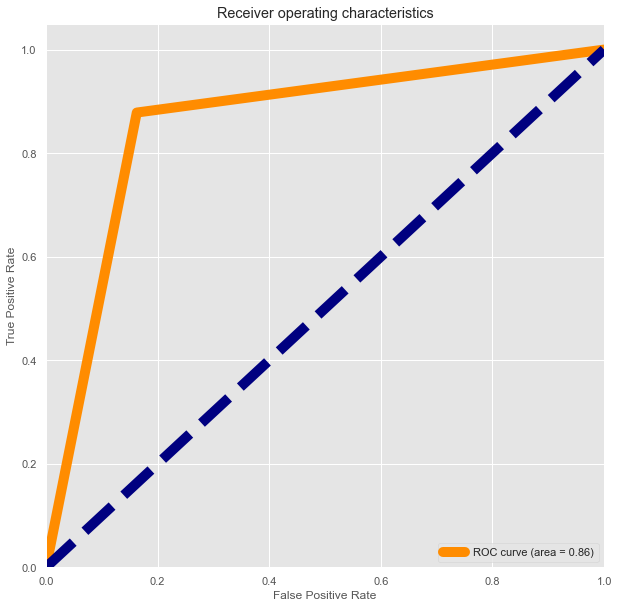

In [70]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### SVM

In [71]:
svc= SVC()
svc.fit(x_train,y_train)
pred_train=svc.predict(x_train)
pred_test=svc.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(svc,x,y,cv=3).mean())

Roc_Auc train:  0.9317796610169491
Roc_Auc test:  0.8743446096387273
Confusion Matrix:  
 [[249  24]
 [ 50 256]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.83      0.91      0.87       273
           1       0.91      0.84      0.87       306

    accuracy                           0.87       579
   macro avg       0.87      0.87      0.87       579
weighted avg       0.88      0.87      0.87       579

CV  :  0.8562176165803109


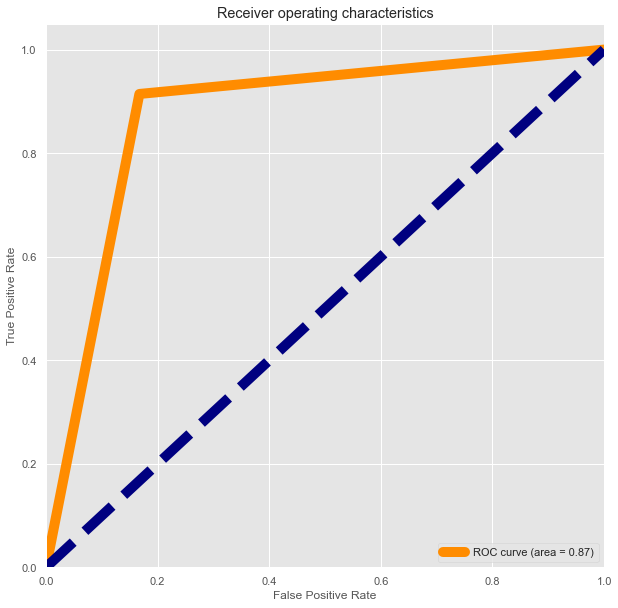

In [72]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Ensembles Techniques

### Random Forest Classifier

In [73]:
rfc= RandomForestClassifier()
rfc.fit(x_train,y_train)
pred_train=rfc.predict(x_train)
pred_test=rfc.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(rfc,x,y,cv=3).mean())

Roc_Auc train:  1.0
Roc_Auc test:  0.8963226316167494
Confusion Matrix:  
 [[261  12]
 [ 50 256]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.84      0.96      0.89       273
           1       0.96      0.84      0.89       306

    accuracy                           0.89       579
   macro avg       0.90      0.90      0.89       579
weighted avg       0.90      0.89      0.89       579

CV  :  0.8847150259067358


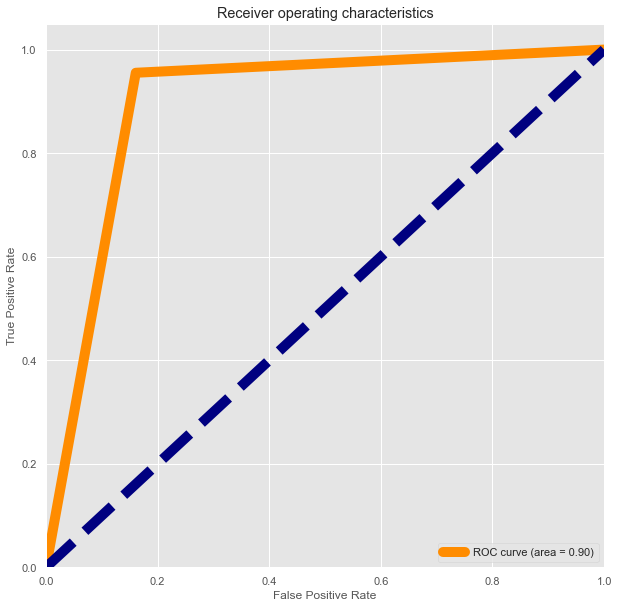

In [74]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### GBC

In [75]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)
pred_test=gbc.predict(x_test)
pred_train=gbc.predict(x_train)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(rfc,x,y,cv=3).mean())

Roc_Auc train:  0.9619857563459856
Roc_Auc test:  0.9210299504417152
Confusion Matrix:  
 [[262  11]
 [ 36 270]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.88      0.96      0.92       273
           1       0.96      0.88      0.92       306

    accuracy                           0.92       579
   macro avg       0.92      0.92      0.92       579
weighted avg       0.92      0.92      0.92       579

CV  :  0.8911917098445595


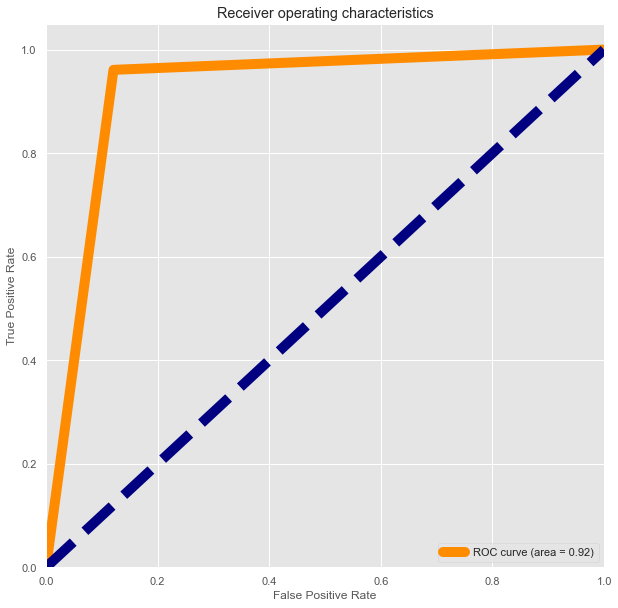

In [76]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### XGboost

In [77]:
xgb= XGBClassifier()
xgb.fit(x_train,y_train)
pred_test=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(rfc,x,y,cv=3).mean())

Roc_Auc train:  1.0
Roc_Auc test:  0.9190009337068159
Confusion Matrix:  
 [[260  13]
 [ 35 271]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.88      0.95      0.92       273
           1       0.95      0.89      0.92       306

    accuracy                           0.92       579
   macro avg       0.92      0.92      0.92       579
weighted avg       0.92      0.92      0.92       579

CV  :  0.8868739205526771


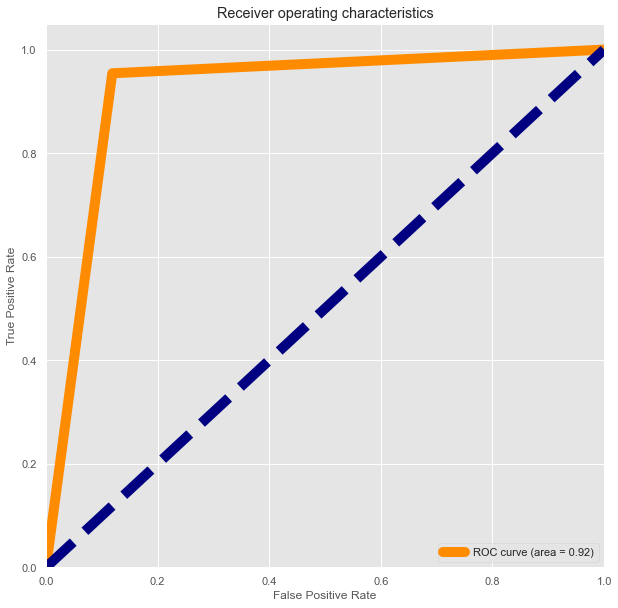

In [78]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

#### Hyperparameter Tuning 

In [79]:
# tunning GradientBoostingClassifier

param_gbc={ 'learning_rate':[0.001,0.01,0.1,1,3],'n_estimators':[50,70,100,250,500],'max_depth':[3,5,7,9]}

gbc_model=GridSearchCV(GradientBoostingClassifier(),param_gbc,cv=3,n_jobs=-1,scoring='roc_auc',verbose=True).fit(x_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [80]:
gbc_model.best_params_

{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 250}

In [81]:
gbc_model.best_score_

0.9678125248667144

In [83]:
gbc_model_final=GradientBoostingClassifier( learning_rate=0.1,n_estimators=250,max_depth=7,random_state=14).fit(x_train,y_train)

In [84]:
train_pred = gbc_model_final.predict(x_train)
test_pred = gbc_model_final.predict(x_test)

In [85]:
print('ROC_AUC_Train: ', roc_auc_score(y_train, train_pred))
print('--------------------------------------------------------------------')
print('ROC_AUC_Test: ', roc_auc_score(y_test, test_pred))

ROC_AUC_Train:  1.0
--------------------------------------------------------------------
ROC_AUC_Test:  0.9261294261294262


In [87]:
print(classification_report(y_test, gbc_model_final.predict(x_test)))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       273
           1       0.96      0.89      0.93       306

    accuracy                           0.92       579
   macro avg       0.93      0.93      0.92       579
weighted avg       0.93      0.92      0.92       579



In [89]:
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,test_pred))

Confusion Matrix:  
 [[263  10]
 [ 34 272]]


##### The Confusion Matrix show the enchancement done on the tunning model using GridearchCV method.

-------------------------------------------------------------------------------------------------------------------------------

## Saving Model

In [90]:
#Saving the model using .pkl
import joblib
joblib.dump(gbc_model_final,"HR.pkl")

['HR.pkl']

In [91]:
# load model and get predictions

model=joblib.load('HR.pkl')

#Predict

prediction = model.predict(x_test)

prediction

array([0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,

In [92]:
pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578
Predicted,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,1,0,1,1,1,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,1,1,0,0,0,0,1,0,0,1,1,0,1,0,1,1,0,1,0,1,1,1,1,1,1,0,0,1,1,0,1,1,1,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,1,1,1,0,1,1,0,0,0,1,1,0,1,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,1,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,1,1,0,1,1,1,0,0,1,1,1,1,0,1,0,1,0,1,1,1,0,1,0,1,0,0,1,1,1,0,1,1,1,0,0,0,1,1,1,0,1,1,1,1,1,0,0,1,0,0,1,0,1,1,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,1,0,1,0,1,1,1,1,0,0,0,0,0,0,1,1,0,1,1,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,1,1,1,1,1,0,0,1,0,1,0,0,0,0,1,1,1,1,1,1,0,1,0,1,1,1,1,1,0,1,1,1,0,1,1,0,1,0,1,1,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,0,0,0,1,1,0,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,1,0,0,0,0,1,1,1,1,1,1,0,0,1,1,1,0,1,0,0,0,0,0,0,1,1,1,1,1,0,1,1,1,1,1,0,1,0,1,0,1,0,0,0,0,0,1,1,0,0,1,0,1,0,0,1,1,1,0,0,0,1,0,1,1,1,1,0,1,1,0,1,0,0,0,0,1,1,0,1,0,1,1,1,1,0,1,1,1,1,1,0,1,1,0,0,0,0,0,1,0,1,0,1,1,0
Original,0,0,1,0,1,1,1,1,1,1,1,1,0,0,0,1,0,1,1,1,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,1,0,0,1,0,0,1,1,0,1,0,0,1,0,1,1,1,1,1,1,1,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,0,1,1,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,1,0,0,0,0,1,1,1,1,1,0,1,1,0,0,0,1,1,0,1,1,1,1,0,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,0,1,1,0,1,1,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,1,1,0,1,1,1,0,0,1,1,1,1,0,1,0,1,0,1,1,1,0,1,0,1,1,1,1,1,1,0,1,1,1,0,0,0,1,1,1,0,1,1,1,1,1,0,0,1,0,0,1,0,1,1,1,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,0,0,1,1,1,1,0,1,0,0,0,0,1,1,0,1,1,0,0,0,0,1,1,0,1,